In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 150
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#<font size=10> Practical Applications Grid Search Algorithms</font>

In [2]:
!pip install geneticalgorithm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 KB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for func-timeout: filename=func_timeout-4.3.5-py3-none-any.whl size=15098 sha256=a3a1a28f2a44f2f008a081872e0501f67f5cbc4da15f4f8aed358b4b5b3edc43
  Stored in directory: /home/jovyan/.cache/pip/wheels/ef/91/3f/17cbea1e83d17cc01bd2d66a0d59e65301bcb2d59f2f6a62ab
Successfully built func-timeout


In [3]:
!pip install pyswarms

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 KB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.2/829.2 KB 66.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491070 sha256=03053ba173ca07def72bbeb2430a42bf8f342a3a3c724265f9bf6275b2b8d9b4
  Stored in directory: /home/jovyan/.cache/pip/wheels/2f/a0/d3/4030d9f80e6b3be787f19fc911b8e7aa462986a40ab1e4bb94
Successfully built future


In [4]:
# Import modules
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
from IPython.display import Image
from IPython.display import HTML, display
import pyswarms as ps

In [5]:
from pyswarms.utils.functions import single_obj as fx
from pyswarms.utils.plotters import (plot_cost_history, plot_contour, plot_surface)
from pyswarms.utils.plotters.formatters import Mesher
from pyswarms.utils.plotters.formatters import Designer

In [6]:
import numpy as np
from geneticalgorithm import geneticalgorithm as ga
from mpl_toolkits.mplot3d import Axes3D

## Example 1 - An objective function that has more than two local minima, one of which being optimal

$$\large -2\cdot e^{-\frac{(x-1)^2+y^2}{0.5}}-3\cdot e^{-\frac{(x+1)^2+y^2}{0.5}}-4\cdot e^{-\frac{x^2+(y-1)^2}{0.5}}+x^2 +y^2$$

In [8]:
# objective function
def objective(x):
	return -2*np.exp(-((x[0]-1.0)**2+x[1]**2)/.5)-3*np.exp(-((x[0]+1.0)**2+x[1]**2)/.5)-\
  				4*np.exp(-((x[0])**2+(x[1]-1)**2)/.5) + x[0]**2+x[1]**2

## The Application of the Genetic Algorithm

 The best solution found:                                                                           
 [-0.00821     0.85322358]

 Objective function:
 -3.2616211151291843


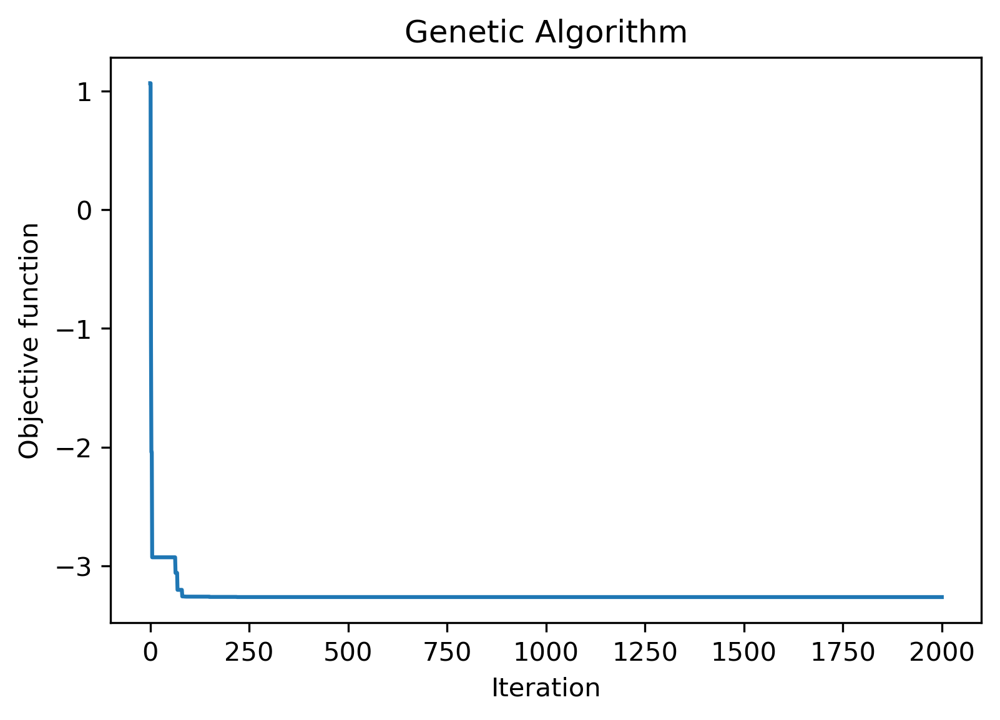

In [9]:
varbound=np.array([[-10,10]]*2) # pick where to guess somewhere between -10 and 10

model=ga(function=objective,dimension=2,variable_type='real',variable_boundaries=varbound)

model.run()

In [10]:
# define range for input
r_min, r_max = -2.0, 2.0
xaxis = np.arange(r_min, r_max, 0.01)
yaxis = np.arange(r_min, r_max, 0.01)
# create a mesh from the axis
X = np.meshgrid(xaxis, yaxis)
# compute targets
results = objective(X)

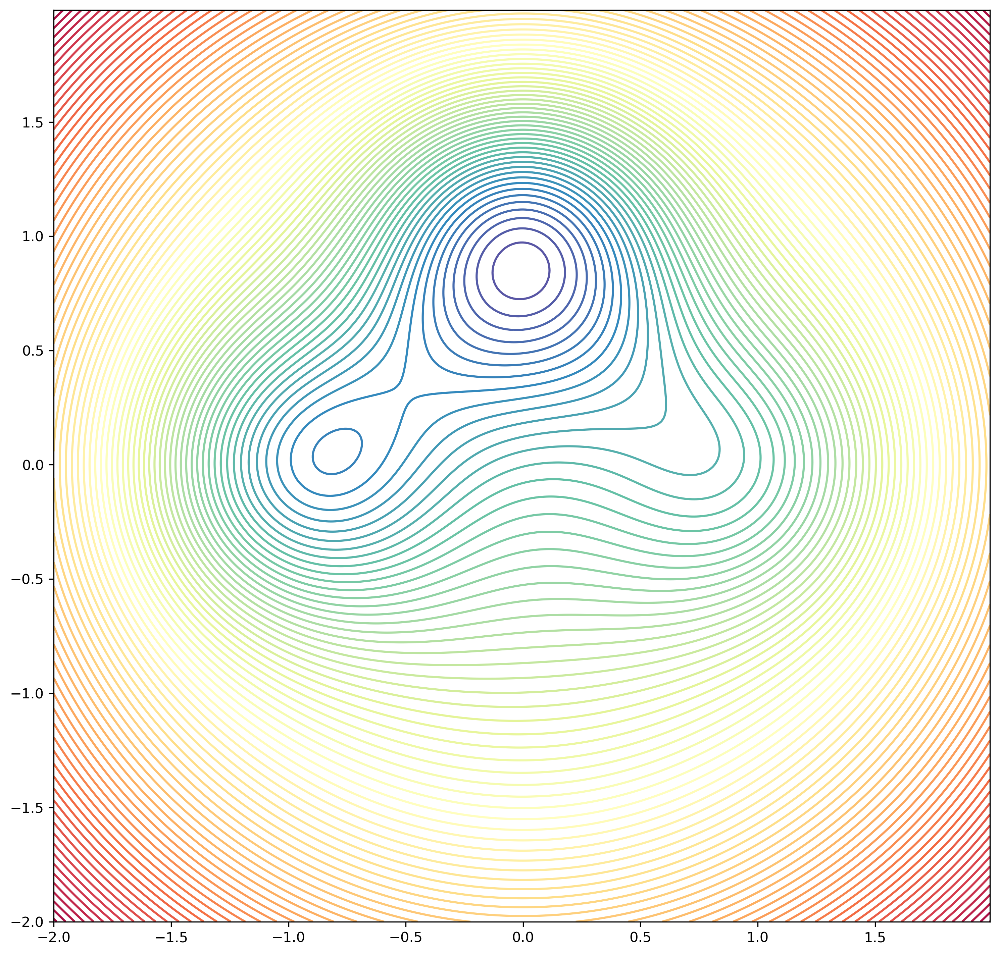

In [11]:
figure = plt.figure(figsize=(12,12))
plt.contour(X[0],X[1], results, 100, alpha=1.0, cmap='Spectral_r')
plt.show()

/tmp/ipykernel_65/3745119918.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  axis = figure.gca(projection='3d')


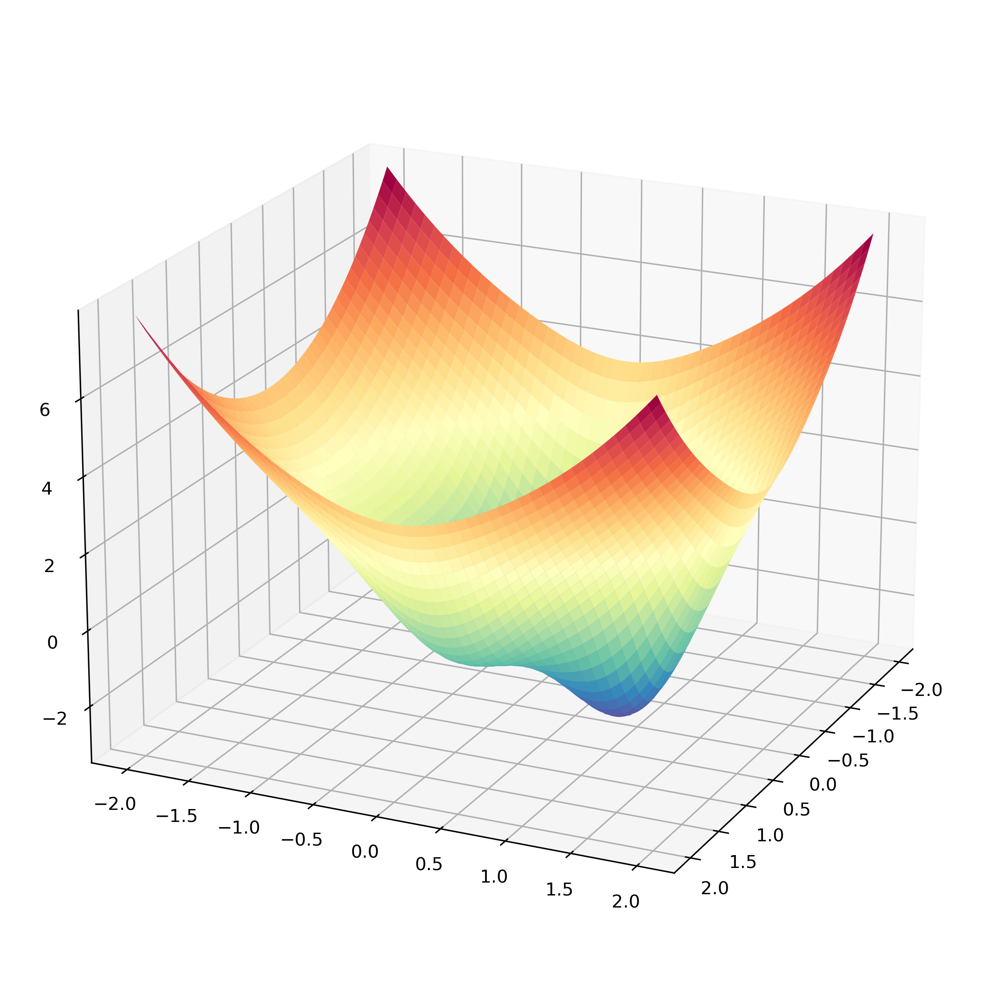

In [12]:
# create a surface plot with the jet color scheme
figure = plt.figure(figsize=(12,10))
axis = figure.gca(projection='3d')
axis.plot_surface(X[0], X[1], results, cmap='Spectral_r')
axis.view_init(20,25)
# show the plot
plt.show()

In [13]:
# Example of interactive 3-D plot
import plotly.graph_objs as go

fig = go.Figure(data=[go.Surface(z=results, x=X[0], y=X[1],colorscale='Jet')])
fig.update_layout(title='Non-Convex Surface', autosize=True,
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.75}})
fig.show()

ModuleNotFoundError: No module named 'plotly'

## Example 2 - Multiple equivalent local minima

The obective is:

$$\large (x^2+y-11)^2 +(x+y^2-7)^2$$

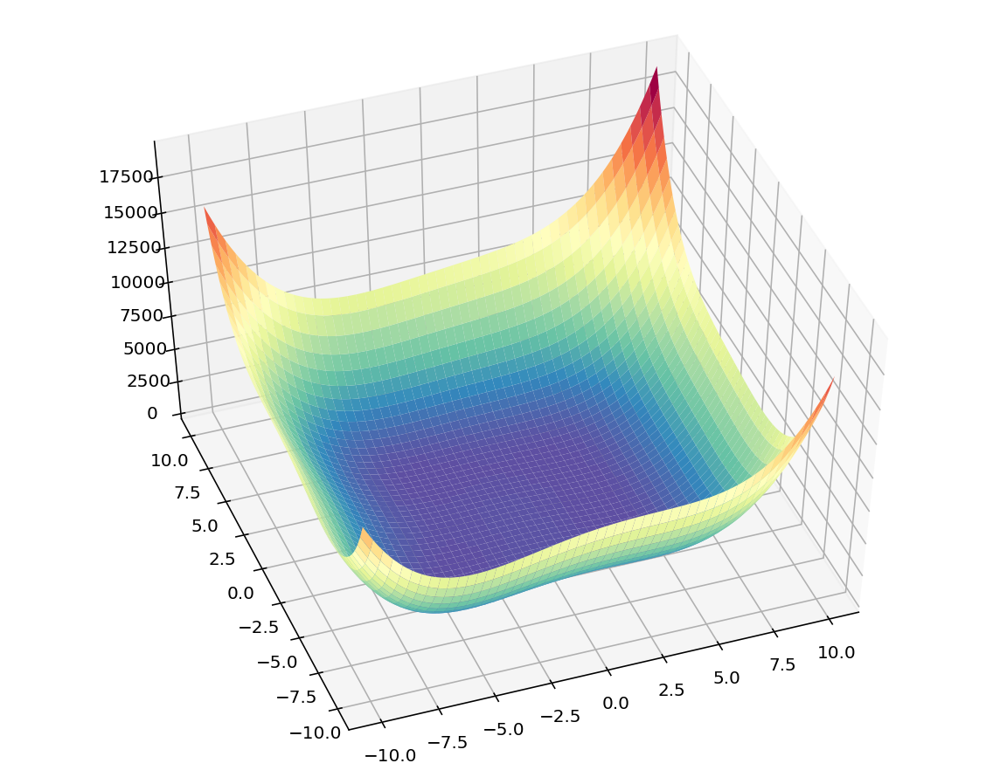

In [ ]:

# multimodal test function (Himmelblau function)

 
# objective function
def objective2_ga(X):
	return (X[0]**2 + X[1] - 11)**2 + (X[0] + X[1]**2 -7)**2
 
# define range for input
r_min, r_max = -10.0, 10.0
# sample input range uniformly at 0.1 increments
xaxis = np.arange(r_min, r_max, 0.1)
yaxis = np.arange(r_min, r_max, 0.1)
# create a mesh from the axis
X = np.meshgrid(xaxis, yaxis)
# compute targets
results = objective2_ga(X)
# create a surface plot with the jet color scheme
figure = plt.figure(figsize=(10,8))
axis = figure.gca(projection='3d')
axis.plot_surface(X[0], X[1], results, cmap='Spectral_r')
axis.view_init(50,250)
# show the plot
plt.show()

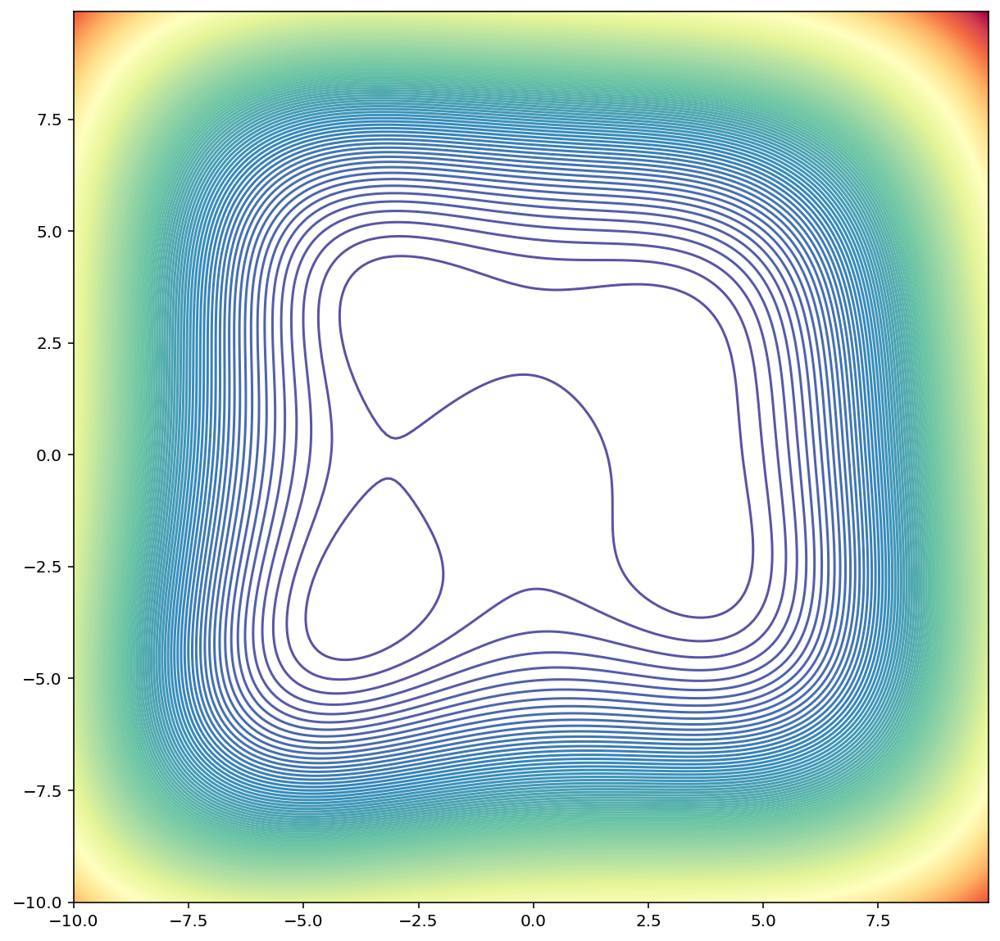

In [ ]:
figure = plt.figure(figsize=(10,10))
plt.contour(X[0], X[1], results, 200, alpha=1.0, cmap='Spectral_r')
plt.show()

 The best solution found:
 [ 3.58408268 -1.84802988]

 Objective function:
 6.164226471452825e-06


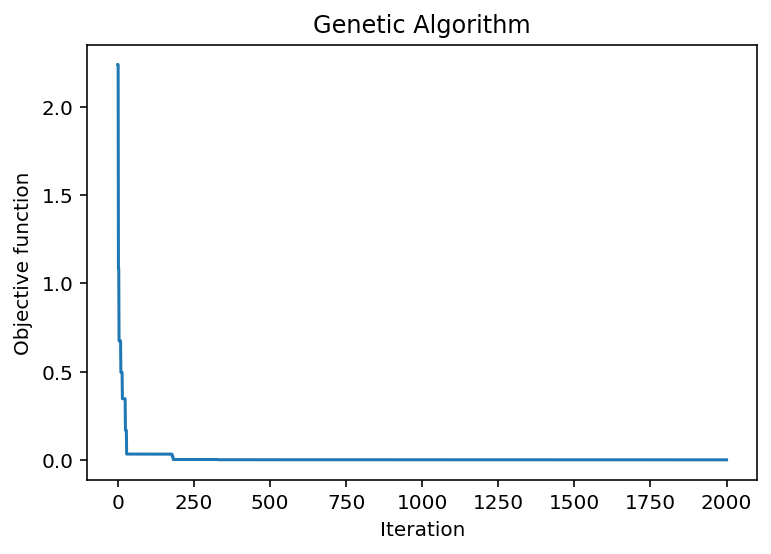

In [ ]:
varbound=np.array([[-10,10]]*2)

model=ga(function=objective2,dimension=2,variable_type='real',variable_boundaries=varbound)

model.run()

##Application of PSO to the second objective function

In [ ]:
import pyswarms as ps

In [ ]:
# instantiate the optimizer
max = np.array([10,10])
min = np.array([-10,-10])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.6, 'w': 0.7}
optimizer = ps.single.GlobalBestPSO(n_particles=30, dimensions=2, options=options, bounds=bounds)

In [ ]:
# objective function
def objective1(x):
	return -2*np.exp(-((x[:,0]-1.0)**2+x[:,1]**2)/.5)-3*np.exp(-((x[:,0]+1.0)**2+x[:,1]**2)/.5)-\
	4*np.exp(-((x[:,0])**2+(x[:,1]-1)**2)/.5) + x[:,0]**2+x[:,1]**2

In [ ]:
# objective function with column vectors for the format wanted by the PSO algorithm
def objective2_pso(X):
	return (X[:,0]**2 + X[:,1] - 11)**2 + (X[:,0] + X[:,1]**2 -7)**2

In [ ]:
cost, pos = optimizer.optimize(objective2, iters=2000)

2022-04-04 12:40:12,935 - pyswarms.single.global_best - INFO - Optimize for 2000 iters with {'c1': 0.25, 'c2': 0.6, 'w': 0.7}
pyswarms.single.global_best: 100%|██████████|2000/2000, best_cost=7.89e-31
2022-04-04 12:40:16,614 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 7.888609052210118e-31, best pos: [-3.77931025 -3.28318599]


In [ ]:
pos[0]

-3.779310253377747

In [ ]:
pos_genetic = [ 3.58408268, -1.84802988]

In [ ]:
objective2_ga(pos_genetic)

6.1642666014713e-06

In [ ]:
objective2_ga(pos)

7.888609052210118e-31

## Application with Simulated Annealing

In [50]:
from scipy.optimize import dual_annealing

In [58]:
lw = [-10] * 2
up = [10] * 2
output = dual_annealing(objective2_ga, bounds=list(zip(lw, up)),maxiter=10000)

In [59]:
output

     fun: 6.252054910824463e-16
 message: ['Maximum number of iteration reached']
    nfev: 82072
    nhev: 0
     nit: 10000
    njev: 0
  status: 0
 success: True
       x: array([ 3.58442834, -1.84812653])

In [54]:
list(zip(lw, up))

[(-10, 10), (-10, 10)]

## PSO Animations

In [ ]:
# objective function
def objective1(X):
	return -2*np.exp(-((X[:,0]-1.0)**2+X[:,1]**2)/.2)-3*np.exp(-((X[:,0]+1.0)**2+X[:,1]**2)/.2) + X[:,0]**2+X[:,1]**2

In [ ]:
# instantiate the optimizer
max = np.array([2,2])
min = np.array([-2,-2])
bounds = (min, max)
options = {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=2, options=options, bounds=bounds)

# now run the optimization, pass a=1 and b=100 as a tuple assigned to args

cost, pos = optimizer.optimize(objective1, iters=100)

2021-11-02 12:42:07,032 - pyswarms.single.global_best - INFO - Optimize for 100 iters with {'c1': 0.25, 'c2': 0.5, 'w': 0.5}
pyswarms.single.global_best: 100%|██████████|100/100, best_cost=-2.06
2021-11-02 12:42:07,277 - pyswarms.single.global_best - INFO - Optimization finished | best cost: -2.0630902517681946, best pos: [-9.36300635e-01  2.63146792e-09]


In [ ]:
# Initialize mesher with the function
m = Mesher(func=objective1,delta=0.01,limits=[(-2,2),(-2,2)])

In [ ]:
%%capture
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,mesher=m,mark=(-1,0),designer=Designer(limits=[(-2,2), (-2,2)], label=['x-axis', 'y-axis']))

In [ ]:
HTML(animation.to_html5_video())

2022-04-04 01:51:53,544 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2022-04-04 01:51:53,548 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 720x576 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmp66w5s9k2/temp.m4v


2021-11-01 21:08:41,147 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.PillowWriter'>


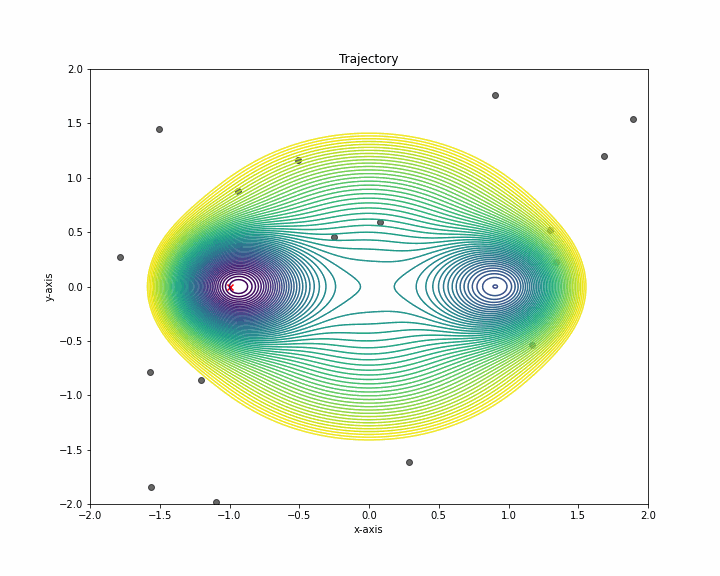

In [ ]:
# Enables us to view it in a Jupyter notebook
animation.save('result2D.gif', writer='pillow', fps=15)
Image(open('result2D.gif','rb').read())